In [1]:
import pandas as pd
import gensim
from pprint import pprint
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt
import pyLDAvis.gensim

In [2]:
docs_df = pd.read_csv('../../data/law_analyzer_new4_title-content-clean.csv')
docs_df

,_id,title,content,clean_title,clean_content
0,221-pmk.010-2015,PENGENAAN BEA MASUK ANTI DUMPING TERHADAP IMPO...,Terhadapimporproduk _Biaxially_ _Oriented_ _P...,bea anti dumping impor produk oriented polyeth...,terhadapimporproduk negara india rakyat tiongk...
1,pp-21-tahun-2005,STANDAR NASIONAL PENDIDIKAN,KETENTUAN UMUM Dalam Peraturan Pemerintah ini ...,standar nasional didik,umum perintah standar nasional didik kriteria ...
2,pp-51-tahun-2008,PERUBAHAN NAMA KABUPATEN YAPEN WAROPEN MENJADI...,Nama Kabupaten Yapen Waropen sebagai daerah o...,ubah nama kabupaten yapen waropen kabupaten pu...,nama kabupaten yapen waropen daerah otonom wil...
3,62-pmk.04-2018,PERUBAHAN KEDUA ATAS PERATURAN MENTERI KEUANGA...,(1) Metode pengulangan ( _fallback_) sebagaim...,ubah uang pmk nilai pabean hitung bea,metode ulang ulang prinsip tata wajar konsiste...
4,42-pmk.05-2017,PERUBAHAN ATAS PERATURAN MENTERI KEUANGAN NOMO...,(1) Laporan Keuangan BLU sebagaimana dimaksud...,ubah uang pmk sistem akuntansi lapor uang bada...,lapor uang blu rangka pengintegrasian lapor ua...
...,...,...,...,...,...
2997,pp-9-tahun-2014,PELAKSANAAN UNDANG-UNDANG NOMOR 4 TAHUN 2011 T...,KETENTUAN UMUM Dalam Peraturan Pemerintah ini ...,laksana informasi geospasial,umum perintah geospasial sifat keruangan posis...
2998,pp-25-tahun-2017,PEMBERIAN TUNJANGAN HARI RAYA DALAM TAHUN ANGG...,Dalam Peraturan Pemerintah ini yang dimaksud ...,tunjang raya anggar gawai negeri sipil prajuri...,perintah gawai negeri sipil disingkat pns warg...
2999,160-pmk.04-2010,PELAKSANAAN PENYALURAN DANA ALOKASI KHUSUS TAH...,(1)PenyaluranDanaAlokasiKhusus(DAK)TahunAngga...,laksana salur dana alokasi anggar,penyalurandanaalokasikhusus dak tahap ii tahap...
3000,146-pmk.05-2019,TARIF LAYANAN BADAN LAYANAN UMUM POLITEKNIK KE...,Tarif layanan Badan Layanan Umum Politeknik K...,tarif layan badan layan umum politeknik sehat ...,tarif layan badan layan umum politeknik sehat ...


In [3]:
doc_id_ls = docs_df['_id'].tolist()
title_ls = docs_df['clean_title'].tolist()
content_ls = docs_df['clean_content'].tolist()

In [4]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield gensim.utils.simple_preprocess(str(sentence), deacc=True)
        

def compute_coherence_values(dictionary, corpus, texts, topic_num_start, topic_num_limit, topic_num_step):
    model_list = []
    model_coherence_values = []
    
    for num_topic in range(topic_num_start, topic_num_limit, topic_num_step):
        model = gensim.models.LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=num_topic, eta='auto', random_state=42)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        model_coherence_values.append(coherence_model.get_coherence())
        
    return model_list, model_coherence_values

        
def coherence_plot(coherence_values_list, topic_num_start, topic_num_limit, topic_num_step):
    topic_num = range(topic_num_start, topic_num_limit, topic_num_step)
    plt.plot(topic_num, coherence_values_list)
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence score")
    plt.legend("coherence_values", loc='best')

    plt.show()
    
    
def visualize_topics(model, corpus, id2word):
    pyLDAvis.enable_notebook()
    vis = pyLDAvis.gensim.prepare(model, corpus, id2word)
    return vis

def doc_topics_df(model, corpus, texts, doc_ids):
    # Initialize empty lists to store data
    data = {'doc_id': [], 'topic_num': [], 'topic_perc_contrib': [], 'topic_keywords': [], 'text': []}

    # Get main topic in each document
    for i, row in enumerate(model[corpus]):
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            wp = model.show_topic(topic_num)
            topic_keywords_str = ", ".join([word for word, prop in wp])
            data['doc_id'].append(doc_ids[i])  # Assuming doc_ids contains the document IDs
            data['topic_num'].append(topic_num)
            data['topic_perc_contrib'].append(round(prop_topic, 4))
            data['topic_keywords'].append(topic_keywords_str)
            data['text'].append(texts[i])

    # Create DataFrame from the collected data
    df = pd.DataFrame(data)
    return df


def doc_dom_topics_df(model, corpus, texts, doc_ids):
    # Initialize an empty list to store data
    data = []

    # Get main topic in each document
    for i, row in enumerate(model[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = model.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                data.append([doc_ids[i], int(topic_num), round(prop_topic, 4), topic_keywords, texts[i]])

    # Create DataFrame from the collected data
    df = pd.DataFrame(data, columns=['doc_id', 'dominant_topic_num', 'topic_perc_contrib', 'topic_keywords', 'text'])
    return df

## by content

In [5]:
content_data_words = list(sent_to_words(content_ls))
content_data_words

[['negara',
  'india',
  'rakyat',
  'tiongkok',
  'rrt',
  'thailand',
  'urai',
  'barang',
  'oriented',
  'polyethylene',
  'terephthalate',
  'bopet',
  'bentuk',
  'pelat',
  'lembar',
  'film',
  'plastik',
  'non',
  'seluler',
  'diperkuat',
  'dilaminasi',
  'didukung',
  'dikombinasi',
  'ex',
  'dikenakan',
  'bea',
  'anti',
  'dumping',
  'negara',
  'nama',
  'eksportir',
  'eksportir',
  'produsen',
  'anti',
  'dumping',
  'bea',
  'umum',
  'favoured',
  'no',
  'negara',
  'barang',
  'eksportir',
  'eksportir',
  'produsen',
  'besaran',
  'bea',
  'anti',
  'dumping',
  'persentas',
  'india',
  'srf',
  'vacmet',
  'india',
  'jindal',
  'poly',
  'films',
  'ester',
  'industries',
  'usaha',
  'rrt',
  'packing',
  'co',
  'ltd',
  'usaha',
  'thaila',
  'nd',
  'srfindustries',
  'thailand',
  'limited',
  'polyplex',
  'thailand',
  'public',
  'company',
  'limited',
  'limited',
  'usaha',
  'skema',
  'dalamhalimpor',
  'negara',
  'negara',
  'skema',
  'i

In [6]:
# create dictionary
content_id2word = gensim.corpora.Dictionary(content_data_words)
content_id2word.filter_extremes(no_below=15, no_above=0.5)

# create corpus
content_texts = content_data_words
content_corpus = [content_id2word.doc2bow(text) for text in content_texts]

In [7]:
# compute coherence values
content_topic_start = 2
content_topic_limit = 100
content_topic_step = 6
content_topics = range(content_topic_start, content_topic_limit, content_topic_step)

content_model_list, content_coherence_values = compute_coherence_values(dictionary=content_id2word, corpus=content_corpus, texts=content_data_words, topic_num_start=content_topic_start, topic_num_limit=content_topic_limit, topic_num_step=content_topic_step)

KeyboardInterrupt: 

In [ ]:
# Show coherence values graph
coherence_plot(content_coherence_values, content_topic_start, content_topic_limit, content_topic_step)

In [8]:
# redo the computation with smaller step in the range topic with the highest coherence score
selected_content_topic_start = 60
selected_content_topic_limit = 80
selected_content_topic_step = 1
selected_content_topics = range(selected_content_topic_start, selected_content_topic_limit, selected_content_topic_step)

content_model_list_2, content_coherence_values_2 = compute_coherence_values(dictionary=content_id2word, corpus=content_corpus, texts=content_data_words, topic_num_start=selected_content_topic_start, topic_num_limit=selected_content_topic_limit, topic_num_step=selected_content_topic_step)

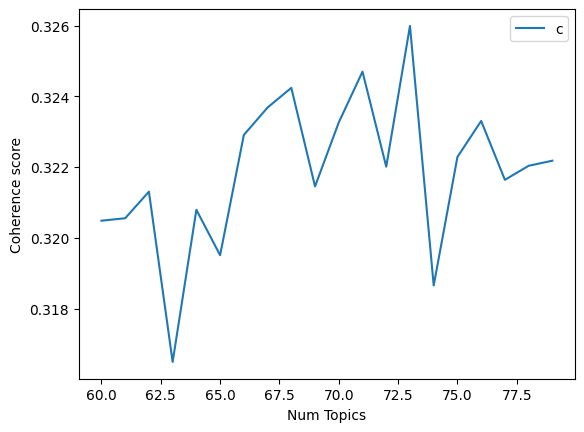

In [9]:
# Show coherence values graph
coherence_plot(content_coherence_values_2, selected_content_topic_start, selected_content_topic_limit, selected_content_topic_step)

In [10]:
# get number of topics and corresponding coherence score
for m, cv in zip(selected_content_topics, content_coherence_values_2):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 5))

Num Topics = 60  has Coherence Value of 0.32048
Num Topics = 61  has Coherence Value of 0.32055
Num Topics = 62  has Coherence Value of 0.3213
Num Topics = 63  has Coherence Value of 0.31649
Num Topics = 64  has Coherence Value of 0.32079
Num Topics = 65  has Coherence Value of 0.31951
Num Topics = 66  has Coherence Value of 0.32291
Num Topics = 67  has Coherence Value of 0.32368
Num Topics = 68  has Coherence Value of 0.32424
Num Topics = 69  has Coherence Value of 0.32145
Num Topics = 70  has Coherence Value of 0.32326
Num Topics = 71  has Coherence Value of 0.3247
Num Topics = 72  has Coherence Value of 0.32201
Num Topics = 73  has Coherence Value of 0.32599
Num Topics = 74  has Coherence Value of 0.31865
Num Topics = 75  has Coherence Value of 0.32228
Num Topics = 76  has Coherence Value of 0.3233
Num Topics = 77  has Coherence Value of 0.32164
Num Topics = 78  has Coherence Value of 0.32204
Num Topics = 79  has Coherence Value of 0.32218


In [11]:
# Select the model with the highest coherence score
optimal_content_model = content_model_list_2[content_coherence_values_2.index(max(content_coherence_values_2))]

# print the topics
pprint(optimal_content_model.print_topics(num_words=10))

[(31,
  '0.020*"lapor" + 0.017*"hewan" + 0.014*"daerah" + 0.009*"sakit" + '
  '0.008*"elektronik" + 0.008*"pajak" + 0.008*"kebun" + 0.008*"persero" + '
  '0.008*"pt" + 0.007*"barang"'),
 (69,
  '0.064*"pajak" + 0.010*"daerah" + 0.009*"jabat" + 0.009*"modal" + '
  '0.009*"bangun" + 0.008*"dana" + 0.008*"jenderal" + 0.008*"rencana" + '
  '0.007*"gawai" + 0.007*"negeri"'),
 (50,
  '0.020*"lelang" + 0.013*"desa" + 0.012*"bantu" + 0.011*"hukum" + '
  '0.011*"jabat" + 0.010*"barang" + 0.010*"dana" + 0.008*"bea" + 0.008*"sehat" '
  '+ 0.007*"daerah"'),
 (33,
  '0.029*"nilai" + 0.022*"barang" + 0.019*"jabat" + 0.013*"pabean" + '
  '0.012*"lembaga" + 0.011*"dokumen" + 0.009*"jenderal" + 0.009*"milik" + '
  '0.008*"kelola" + 0.007*"tugas"'),
 (14,
  '0.027*"biaya" + 0.023*"lapor" + 0.013*"standar" + 0.012*"giat" + '
  '0.011*"akuntansi" + 0.011*"lembaga" + 0.011*"bangun" + 0.009*"nilai" + '
  '0.009*"entitas" + 0.009*"layan"'),
 (17,
  '0.024*"cukai" + 0.023*"bea" + 0.020*"jenderal" + 0.015*"jab

In [12]:
# visualize the topics
visualize_topics(optimal_content_model, content_corpus, content_id2word)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
3     -0.067485  0.096042       1        1  3.607507
22     0.012614 -0.031769       2        1  3.587380
58    -0.013120 -0.046948       3        1  3.559138
18     0.009422 -0.050677       4        1  2.950938
30     0.007167 -0.020553       5        1  2.859666
...         ...       ...     ...      ...       ...
45    -0.022852 -0.007417      69        1  0.335019
53     0.003949  0.007231      70        1  0.299050
59    -0.050536  0.046869      71        1  0.245111
52     0.044604  0.019503      72        1  0.176450
8     -0.003994  0.007131      73        1  0.173280

[73 rows x 5 columns], topic_info=         Term          Freq         Total Category  logprob  loglift
709     pajak  26786.000000  26786.000000  Default  30.0000  30.0000
43      tarif   9494.000000   9494.000000  Default  29.0000  29.0000
3      barang  19206.000000  19206.000000  Default  28.0000  28.0000
285     layan  13199.000000  13199.000000  Default  27.0000  27.0000
1954   pasien   3067.000000   3067.000000  Default  26.0000  26.0000
...       ...           ...           ...      ...      ...      ...
217     jabat     17.940851  15648.819399  Topic73  -5.1667  -0.4131
113    daerah     18.136607  20627.024792  Topic73  -5.1559  -0.6784
468   tingkat     14.734345   7238.130034  Topic73  -5.3636   0.1611
244    kepala     14.948704   8086.267066  Topic73  -5.3492   0.0647
71    anggota     14.313997   8005.484601  Topic73  -5.3926   0.0314

[5079 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
2662      2  0.020085          aa
2662      3  0.020085          aa
2662      4  0.020085          aa
2662      6  0.020085          aa
2662      7  0.020085          aa
...     ...       ...         ...
1871     57  0.005604  yurisdiksi
1871     62  0.002802  yurisdiksi
1871     69  0.028018  yurisdiksi
1871     70  0.002802  yurisdiksi
1871     71  0.005604  yurisdiksi

[73755 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 23, 59, 19, 31, 35, 25, 29, 37, 57, 5, 73, 34, 26, 52, 1, 10, 21, 48, 61, 58, 47, 13, 72, 39, 56, 11, 71, 67, 64, 20, 18, 38, 27, 12, 40, 70, 43, 42, 62, 24, 14, 45, 16, 8, 7, 66, 22, 15, 55, 36, 44, 69, 28, 68, 65, 63, 51, 30, 41, 33, 32, 3, 49, 50, 17, 2, 6, 46, 54, 60, 53, 9])

In [13]:
content_topics_df = doc_topics_df(optimal_content_model, content_corpus, content_ls, doc_id_ls)
content_topics_df

,doc_id,topic_num,topic_perc_contrib,topic_keywords,text
0,221-pmk.010-2015,19,0.0969,"bea, barang, jenderal, pajak, ditanggung, cuka...",terhadapimporproduk negara india rakyat tiongk...
1,221-pmk.010-2015,37,0.8924,"tugas, barang, jabat, jenderal, bea, impor, ke...",terhadapimporproduk negara india rakyat tiongk...
2,pp-21-tahun-2005,60,0.9902,"didik, layan, jabat, desa, daerah, lurah, dana...",umum perintah standar nasional didik kriteria ...
3,pp-51-tahun-2008,40,0.5147,"barang, lelang, layan, tarif, pajak, kabupaten...",nama kabupaten yapen waropen daerah otonom wil...
4,pp-51-tahun-2008,56,0.4622,"daerah, pajak, dana, kabupaten, kota, surat, p...",nama kabupaten yapen waropen daerah otonom wil...
...,...,...,...,...,...
9713,91-pmk.01-2017,21,0.1679,"pajak, barang, jasa, surat, tarif, jenderal, d...",duduk tugas fungsi pusat investasi perintah di...
9714,91-pmk.01-2017,37,0.4873,"tugas, barang, jabat, jenderal, bea, impor, ke...",duduk tugas fungsi pusat investasi perintah di...
9715,91-pmk.01-2017,57,0.2428,"daerah, pinjam, jabat, biaya, rencana, bangun,...",duduk tugas fungsi pusat investasi perintah di...
9716,91-pmk.01-2017,58,0.0502,"dana, biaya, bayar, lapor, jabat, jamin, kelol...",duduk tugas fungsi pusat investasi perintah di...


In [31]:
content_dom_topics_df = doc_dom_topics_df(optimal_content_model, content_corpus, content_ls, doc_id_ls)
content_dom_topics_df

,doc_id,dominant_topic_num,topic_perc_contrib,topic_keywords,text
0,221-pmk.010-2015,37,0.8926,"tugas, barang, jabat, jenderal, bea, impor, ke...",terhadapimporproduk negara india rakyat tiongk...
1,pp-21-tahun-2005,60,0.9888,"didik, layan, jabat, desa, daerah, lurah, dana...",umum perintah standar nasional didik kriteria ...
2,pp-51-tahun-2008,40,0.5147,"barang, lelang, layan, tarif, pajak, kabupaten...",nama kabupaten yapen waropen daerah otonom wil...
3,62-pmk.04-2018,33,0.7765,"nilai, barang, jabat, pabean, lembaga, dokumen...",metode ulang ulang prinsip tata wajar konsiste...
4,42-pmk.05-2017,18,0.9710,"lapor, pajak, bun, daerah, dana, kelola, jende...",lapor uang blu rangka pengintegrasian lapor ua...
...,...,...,...,...,...
2997,pp-9-tahun-2014,22,0.3360,"daerah, data, barang, wakil, gubernur, kabupat...",umum perintah geospasial sifat keruangan posis...
2998,pp-25-tahun-2017,61,0.5640,"jabat, jenderal, daerah, tunjang, gawai, neger...",perintah gawai negeri sipil disingkat pns warg...
2999,160-pmk.04-2010,58,0.7841,"dana, biaya, bayar, lapor, jabat, jamin, kelol...",penyalurandanaalokasikhusus dak tahap ii tahap...
3000,146-pmk.05-2019,3,0.7343,"layan, tarif, kelas, jasa, pajak, sehat, jamin...",tarif layan badan layan umum politeknik sehat ...


In [53]:
# save the model
optimal_content_model.save('models/by_content/lda_model_content.model')

## by title

In [36]:
title_data_words = list(sent_to_words(title_ls))
title_data_words

[['bea',
  'anti',
  'dumping',
  'impor',
  'produk',
  'oriented',
  'polyethylene',
  'bopet',
  'negara',
  'india',
  'rakyat',
  'tiongkok',
  'thailand'],
 ['standar', 'nasional', 'didik'],
 ['ubah',
  'nama',
  'kabupaten',
  'yapen',
  'waropen',
  'kabupaten',
  'pulau',
  'yapen',
  'provinsi',
  'papua'],
 ['ubah', 'uang', 'pmk', 'nilai', 'pabean', 'hitung', 'bea'],
 ['ubah',
  'uang',
  'pmk',
  'sistem',
  'akuntansi',
  'lapor',
  'uang',
  'badan',
  'layan',
  'umum'],
 ['laksana',
  'likuidasi',
  'entitas',
  'akuntansi',
  'anggar',
  'bendahara',
  'umum',
  'negara'],
 ['tata', 'pemungutan', 'setor', 'pajak', 'rokok'],
 ['dana', 'pensiun'],
 ['dipungut', 'cukai'],
 ['alokasi',
  'definitif',
  'dana',
  'hasil',
  'pajak',
  'hasil',
  'wajib',
  'pajak',
  'pribadi',
  'negeri',
  'pajak',
  'hasil',
  'anggar'],
 ['modal', 'negara', 'modal', 'usaha', 'umum', 'perum', 'hutan', 'negara'],
 ['ubah',
  'majelis',
  'permusyawaratan',
  'rakyat',
  'dewan',
  'wakil'

In [37]:
# create dictionary
title_id2word = gensim.corpora.Dictionary(title_data_words)
title_id2word.filter_extremes(no_below=15, no_above=0.5)

# create corpus
title_texts = title_data_words
title_corpus = [title_id2word.doc2bow(text) for text in title_texts]

In [38]:
# compute coherence values
title_topic_start = 2
title_topic_limit = 100
title_topic_step = 6
title_topics = range(title_topic_start, title_topic_limit, title_topic_step)

title_model_list, title_coherence_values = compute_coherence_values(dictionary=title_id2word, corpus=title_corpus, texts=title_data_words, topic_num_start=title_topic_start, topic_num_limit=title_topic_limit, topic_num_step=title_topic_step)

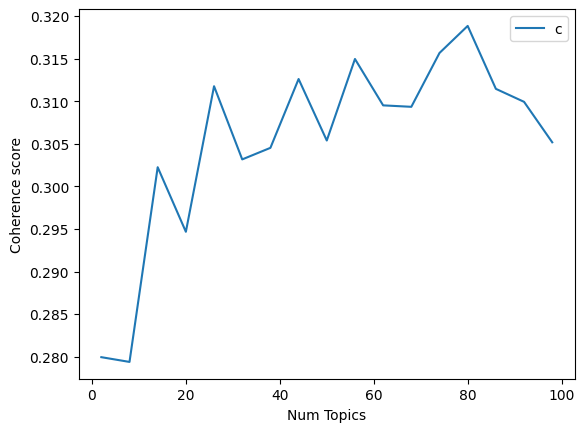

In [39]:
# Show coherence values graph
coherence_plot(title_coherence_values, title_topic_start, title_topic_limit, title_topic_step)

In [40]:
# redo the computation with smaller step in the range topic with the highest coherence score
selected_title_topic_start = 70
selected_title_topic_limit = 90
selected_title_topic_step = 1
selected_title_topics = range(selected_title_topic_start, selected_title_topic_limit, selected_title_topic_step)

title_model_list_2, title_coherence_values_2 = compute_coherence_values(dictionary=title_id2word, corpus=title_corpus, texts=title_data_words, topic_num_start=selected_title_topic_start, topic_num_limit=selected_title_topic_limit, topic_num_step=selected_title_topic_step)

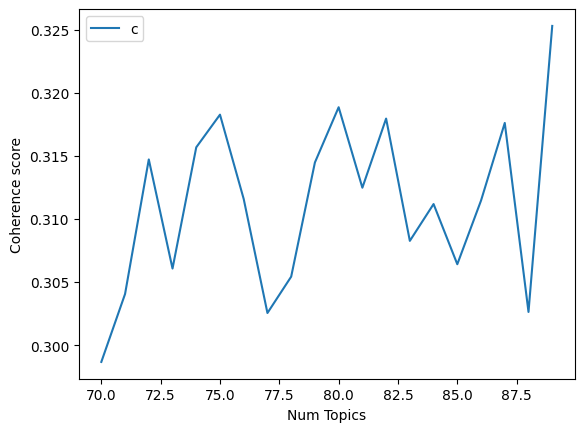

In [41]:
# Show coherence values graph
coherence_plot(title_coherence_values_2, selected_title_topic_start, selected_title_topic_limit, selected_title_topic_step)

In [42]:
# get number of topics and corresponding coherence score
for m, cv in zip(selected_title_topics, title_coherence_values_2):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 5))

Num Topics = 70  has Coherence Value of 0.29867
Num Topics = 71  has Coherence Value of 0.30405
Num Topics = 72  has Coherence Value of 0.31471
Num Topics = 73  has Coherence Value of 0.30607
Num Topics = 74  has Coherence Value of 0.31567
Num Topics = 75  has Coherence Value of 0.31826
Num Topics = 76  has Coherence Value of 0.31158
Num Topics = 77  has Coherence Value of 0.30255
Num Topics = 78  has Coherence Value of 0.30543
Num Topics = 79  has Coherence Value of 0.31447
Num Topics = 80  has Coherence Value of 0.31885
Num Topics = 81  has Coherence Value of 0.31247
Num Topics = 82  has Coherence Value of 0.31795
Num Topics = 83  has Coherence Value of 0.30826
Num Topics = 84  has Coherence Value of 0.31118
Num Topics = 85  has Coherence Value of 0.30641
Num Topics = 86  has Coherence Value of 0.31146
Num Topics = 87  has Coherence Value of 0.3176
Num Topics = 88  has Coherence Value of 0.30263
Num Topics = 89  has Coherence Value of 0.32529


In [43]:
# Select the model with the highest coherence score
optimal_title_model = title_model_list_2[title_coherence_values_2.index(max(title_coherence_values_2))]

In [44]:
# print the topics
pprint(optimal_title_model.print_topics(num_words=10))

[(35,
  '0.084*"uang" + 0.050*"ubah" + 0.036*"pmk" + 0.033*"negara" + 0.028*"sero" + '
  '0.028*"pt" + 0.027*"modal" + 0.027*"persero" + 0.026*"umum" + '
  '0.022*"impor"'),
 (28,
  '0.053*"negara" + 0.050*"pajak" + 0.036*"usaha" + 0.035*"uang" + '
  '0.035*"tata" + 0.029*"barang" + 0.021*"nilai" + 0.020*"tarif" + '
  '0.019*"jenis" + 0.018*"pmk"'),
 (13,
  '0.067*"uang" + 0.032*"pmk" + 0.029*"negara" + 0.029*"daerah" + 0.026*"ubah" '
  '+ 0.023*"persero" + 0.023*"hasil" + 0.023*"negeri" + 0.023*"pensiun" + '
  '0.023*"pt"'),
 (15,
  '0.048*"uang" + 0.036*"negara" + 0.032*"modal" + 0.029*"on" + 0.029*"gawai" '
  '+ 0.029*"alat" + 0.029*"layan" + 0.029*"tunjang" + 0.024*"lingkung" + '
  '0.024*"kinerja"'),
 (60,
  '0.055*"negara" + 0.043*"pajak" + 0.031*"negeri" + 0.030*"jenis" + '
  '0.026*"bumi" + 0.026*"modal" + 0.024*"tarif" + 0.022*"layan" + '
  '0.021*"sipil" + 0.021*"gawai"'),
 (70,
  '0.110*"pajak" + 0.060*"barang" + 0.028*"nilai" + 0.027*"impor" + '
  '0.025*"bea" + 0.024*"angg

In [45]:
# visualize the topics
visualize_topics(optimal_title_model, title_corpus, title_id2word)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
36     0.322910  0.047155       1        1  5.360449
62    -0.060766  0.186929       2        1  5.013571
10    -0.137353  0.021292       3        1  3.898971
75    -0.011512 -0.017447       4        1  2.735681
77     0.230825 -0.010002       5        1  2.708431
...         ...       ...     ...      ...       ...
28    -0.015194 -0.040271      85        1  0.354625
16     0.039823  0.100167      86        1  0.336658
51     0.015994  0.023077      87        1  0.315598
2      0.014153  0.058134      88        1  0.308100
33    -0.001839  0.037933      89        1  0.209075

[89 rows x 5 columns], topic_info=        Term        Freq       Total Category  logprob  loglift
24     layan  643.000000  643.000000  Default  30.0000  30.0000
30     pajak  696.000000  696.000000  Default  29.0000  29.0000
27    anggar  707.000000  707.000000  Default  28.0000  28.0000
20      uang  655.000000  655.000000  Default  27.0000  27.0000
4     negara  816.000000  816.000000  Default  26.0000  26.0000
..       ...         ...         ...      ...      ...      ...
33      tata    0.846873  469.193529  Topic89  -4.0661  -0.1470
63  perintah    0.734274  453.203082  Topic89  -4.2087  -0.2550
3      impor    0.489989  199.560841  Topic89  -4.6132   0.1607
37   alokasi    0.515560  245.907778  Topic89  -4.5624   0.0028
36     cukai    0.408051  118.816743  Topic89  -4.7962   0.4963

[4489 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
150       2  0.208454     aceh
150       5  0.089337     aceh
150       6  0.119117     aceh
150       7  0.059558     aceh
150      17  0.059558     aceh
...     ...       ...      ...
82       54  0.022709  wilayah
82       64  0.022709  wilayah
82       72  0.022709  wilayah
82       77  0.022709  wilayah
82       84  0.045418  wilayah

[7659 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[37, 63, 11, 76, 78, 30, 88, 7, 43, 9, 8, 13, 62, 39, 66, 21, 40, 41, 86, 75, 58, 70, 23, 20, 45, 33, 72, 4, 81, 54, 16, 50, 67, 22, 59, 1, 48, 26, 42, 80, 84, 60, 10, 24, 36, 55, 47, 71, 14, 15, 87, 38, 44, 68, 27, 57, 49, 65, 53, 64, 69, 85, 5, 25, 31, 46, 73, 28, 6, 2, 35, 32, 51, 12, 89, 56, 18, 77, 74, 61, 19, 83, 82, 79, 29, 17, 52, 3, 34])

In [46]:
title_topics_df = doc_topics_df(optimal_title_model, title_corpus, title_ls, doc_id_ls)
title_topics_df

,doc_id,topic_num,topic_perc_contrib,topic_keywords,text
0,221-pmk.010-2015,65,0.8901,"anggar, umum, negara, tunjang, layan, gawai, i...",bea anti dumping impor produk oriented polyeth...
1,pp-21-tahun-2005,50,0.4591,"ubah, uang, negara, pmk, wakil, modal, usaha, ...",standar nasional didik
2,pp-21-tahun-2005,66,0.2965,"uang, perintah, kabupaten, ubah, lapor, hasil,...",standar nasional didik
3,pp-51-tahun-2008,42,0.8587,"jenis, tarif, negara, layan, sehat, terima, pa...",ubah nama kabupaten yapen waropen kabupaten pu...
4,62-pmk.04-2018,61,0.8764,"uang, pmk, ubah, tata, negara, pajak, negeri, ...",ubah uang pmk nilai pabean hitung bea
...,...,...,...,...,...
10074,pp-25-tahun-2017,74,0.4404,"negara, anggar, negeri, daerah, tunjang, sipil...",tunjang raya anggar gawai negeri sipil prajuri...
10075,pp-25-tahun-2017,75,0.4945,"negara, gawai, lingkung, tata, negeri, tunjang...",tunjang raya anggar gawai negeri sipil prajuri...
10076,160-pmk.04-2010,79,0.8352,"negara, pmk, ubah, uang, modal, dana, anggar, ...",laksana salur dana alokasi anggar
10077,146-pmk.05-2019,36,0.8901,"layan, umum, badan, tarif, rumah, sehat, sakit...",tarif layan badan layan umum politeknik sehat ...


In [47]:
title_dom_topics_df = doc_dom_topics_df(optimal_title_model, title_corpus, title_ls, doc_id_ls)
title_dom_topics_df

,doc_id,dominant_topic_num,topic_perc_contrib,topic_keywords,text
0,221-pmk.010-2015,65,0.8901,"anggar, umum, negara, tunjang, layan, gawai, i...",bea anti dumping impor produk oriented polyeth...
1,pp-21-tahun-2005,50,0.4556,"ubah, uang, negara, pmk, wakil, modal, usaha, ...",standar nasional didik
2,pp-51-tahun-2008,42,0.8587,"jenis, tarif, negara, layan, sehat, terima, pa...",ubah nama kabupaten yapen waropen kabupaten pu...
3,62-pmk.04-2018,61,0.8764,"uang, pmk, ubah, tata, negara, pajak, negeri, ...",ubah uang pmk nilai pabean hitung bea
4,42-pmk.05-2017,20,0.6708,"uang, bea, pmk, sehat, lapor, akuntansi, badan...",ubah uang pmk sistem akuntansi lapor uang bada...
...,...,...,...,...,...
2997,pp-9-tahun-2014,10,0.6704,"pajak, tata, barang, nilai, hasil, uang, ubah,...",laksana informasi geospasial
2998,pp-25-tahun-2017,75,0.5501,"negara, gawai, lingkung, tata, negeri, tunjang...",tunjang raya anggar gawai negeri sipil prajuri...
2999,160-pmk.04-2010,79,0.8352,"negara, pmk, ubah, uang, modal, dana, anggar, ...",laksana salur dana alokasi anggar
3000,146-pmk.05-2019,36,0.8901,"layan, umum, badan, tarif, rumah, sehat, sakit...",tarif layan badan layan umum politeknik sehat ...


In [56]:
# save the model
optimal_title_model.save('models/by_title/lda_model_title.model')